<a href="https://colab.research.google.com/github/pk1510/CGAN/blob/main/HTC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
!pip install -U torch==1.5.1+cu101 torchvision==0.6.1+cu101 -f https://download.pytorch.org/whl/torch_stable.html
!pip install mmcv-full
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .
!pip install Pillow==7.0.0


Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 704.4MB 26kB/s 
     |████████████████████████████████| 6.6MB 11.7MB/s 
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101
     |████████████████████████████████| 225kB 13.1MB/s 
     |████████████████████████████████| 194kB 33.7MB/s 
  Created wheel for mmcv-full: filename=mmcv_full-1.2.5-cp36-cp36m-linux_x86_64.whl size=20217640 sha256=bf787fb65b5f2557defd64cfc4bc05f3e341f398b709fd557670a30f78cdf3c4
  Stored in directory: /root/.cache/pip/wheels/1e/6a/d1/a824675d02cbe25db916fa987e87df21983bb75b3bb36cf4d0
Successfully built mmcv-full
Cloning into 'mmdetection'...
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.


In [3]:
#!rm -rf checkpoints
!mkdir checkpoints
!wget -c http://download.openmmlab.com/mmdetection/v2.0/htc/htc_r50_fpn_1x_coco/htc_r50_fpn_1x_coco_20200317-7332cf16.pth \
      -P checkpoints
!ls checkpoints

--2021-01-10 09:37:12--  http://download.openmmlab.com/mmdetection/v2.0/htc/htc_r50_fpn_1x_coco/htc_r50_fpn_1x_coco_20200317-7332cf16.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.35
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.35|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 321325972 (306M) [application/octet-stream]
Saving to: ‘checkpoints/htc_r50_fpn_1x_coco_20200317-7332cf16.pth’

htc_r50_fpn_1x_coco 100%[===================>] 306.44M  8.82MB/s    in 36s     

2021-01-10 09:37:49 (8.56 MB/s) - ‘checkpoints/htc_r50_fpn_1x_coco_20200317-7332cf16.pth’ saved [321325972/321325972]

htc_r50_fpn_1x_coco_20200317-7332cf16.pth


In [5]:
#from mmdet.datasets.my_dataset import MyDataset
!pwd
import mmcv
from mmcv import Config
from mmdet.apis import set_random_seed
cfg=Config.fromfile(r"configs/htc/htc_without_semantic_r50_fpn_1x_coco.py")
for i in range(len(cfg.model.roi_head.bbox_head)):
  cfg.model.roi_head.bbox_head[i].num_classes=1
  cfg.model.roi_head.mask_head[i].num_classes=1
cfg.load_from=r"checkpoints/htc_r50_fpn_1x_coco_20200317-7332cf16.pth"

data_root=r"/content/drive/MyDrive/wheat-coco/archive/coco/"
cfg.data.train.data_root=data_root
cfg.data.train.classes=('wheat',)
cfg.data.train.ann_file=data_root + r"annotations/instances_train2017.json"
cfg.data.train.img_prefix=data_root + r"train2017/"

cfg.data.val.data_root=data_root
cfg.data.val.classes=('wheat',)
cfg.data.val.ann_file=data_root + r"annotations/instances_val2017.json"
cfg.data.val.img_prefix=data_root + r"val2017/"

cfg.data.test.data_root=data_root
cfg.data.test.classes=('wheat',)
cfg.data.test.ann_file=data_root + r"annotations/instances_val2017.json"
cfg.data.test.img_prefix=data_root + r"val2017/"

cfg.work_dir = r"/content/drive/MyDrive/wheat-coco/htc_r50fpn_withoutSemantic_work_dir"
cfg.optimizer.lr = 0.02/8                                # Since we are using a single GPU only.
cfg.lr_config.warmup = None
cfg.log_config.interval = 5
cfg.total_epochs = 12
cfg.evaluation.interval = 5
cfg.checkpoint_config.interval = 5
cfg.seed = 0
cfg.gpu_ids = range(1)

set_random_seed(0, deterministic=False)


/content/mmdetection


In [ ]:
import os
import os.path as osp
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import inference_detector, init_detector, show_result_pyplot, train_detector
print(cfg.dataset_type)
datasets=[build_dataset(cfg.data.train)]
model=build_detector(cfg.model, train_cfg=cfg.train_cfg, test_cfg=cfg.test_cfg)
model.CLASSES=datasets[0].CLASSES
print(datasets[0].CLASSES)
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

CocoDataset
loading annotations into memory...
Done (t=1.04s)
creating index...
index created!


2021-01-09 06:55:52,619 - mmdet - INFO - load model from: torchvision://resnet50
2021-01-09 06:55:52,854 - mmdet - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias



('wheat',)
loading annotations into memory...


2021-01-09 06:55:57,437 - mmdet - INFO - load checkpoint from checkpoints/htc_r50_fpn_1x_coco_20200317-7332cf16.pth


Done (t=0.26s)
creating index...
index created!


2021-01-09 06:55:57,664 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.0.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.0.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.1.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.1.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.2.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.2.fc_cls.bias: copying 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 338/338, 1.1 task/s, elapsed: 310s, ETA:     0s

2021-01-09 08:09:32,366 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=37.38s).
Accumulating evaluation results...


2021-01-09 08:10:10,643 - mmdet - INFO - Evaluating segm...


DONE (t=0.76s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.492
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.895
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.490
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.090
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.483
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.538
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.558
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.558
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.558
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.183
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.549
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.604
Loading and preparing resul

2021-01-09 08:10:49,231 - mmdet - INFO - Epoch(val) [5][479]	bbox_mAP: 0.4920, bbox_mAP_50: 0.8950, bbox_mAP_75: 0.4900, bbox_mAP_s: 0.0900, bbox_mAP_m: 0.4830, bbox_mAP_l: 0.5380, bbox_mAP_copypaste: 0.492 0.895 0.490 0.090 0.483 0.538, segm_mAP: 0.4900, segm_mAP_50: 0.8960, segm_mAP_75: 0.4800, segm_mAP_s: 0.0930, segm_mAP_m: 0.4820, segm_mAP_l: 0.5320, segm_mAP_copypaste: 0.490 0.896 0.480 0.093 0.482 0.532


DONE (t=0.75s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.490
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.896
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.480
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.093
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.482
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.532
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.558
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.558
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.558
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.192
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.551
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.598


2021-01-09 08:11:01,540 - mmdet - INFO - Epoch [6][5/479]	lr: 2.500e-03, eta: 1:34:52, time: 2.445, data_time: 0.771, memory: 5198, loss_rpn_cls: 0.0259, loss_rpn_bbox: 0.0575, s0.loss_cls: 0.1801, s0.acc: 91.8359, s0.loss_bbox: 0.1757, s0.loss_mask: 0.2591, s1.loss_cls: 0.0909, s1.acc: 92.4886, s1.loss_bbox: 0.2424, s1.loss_mask: 0.1215, s2.loss_cls: 0.0565, s2.acc: 90.0071, s2.loss_bbox: 0.1378, s2.loss_mask: 0.0479, loss: 1.3953
2021-01-09 08:11:10,498 - mmdet - INFO - Epoch [6][10/479]	lr: 2.500e-03, eta: 1:34:44, time: 1.792, data_time: 0.149, memory: 5198, loss_rpn_cls: 0.0240, loss_rpn_bbox: 0.0569, s0.loss_cls: 0.1843, s0.acc: 91.6211, s0.loss_bbox: 0.1736, s0.loss_mask: 0.2408, s1.loss_cls: 0.0887, s1.acc: 92.2318, s1.loss_bbox: 0.2377, s1.loss_mask: 0.1069, s2.loss_cls: 0.0560, s2.acc: 89.7386, s2.loss_bbox: 0.1440, s2.loss_mask: 0.0445, loss: 1.3573
2021-01-09 08:11:19,529 - mmdet - INFO - Epoch [6][15/479]	lr: 2.500e-03, eta: 1:34:36, time: 1.807, data_time: 0.168, memory: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 338/338, 1.6 task/s, elapsed: 214s, ETA:     0s

2021-01-09 09:23:31,307 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=36.26s).
Accumulating evaluation results...


2021-01-09 09:24:08,447 - mmdet - INFO - Evaluating segm...


DONE (t=0.74s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.503
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.906
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.505
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.101
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.496
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.545
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.568
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.568
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.568
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.226
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.562
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.603
Loading and preparing resul

2021-01-09 09:24:46,577 - mmdet - INFO - Epoch(val) [10][479]	bbox_mAP: 0.5030, bbox_mAP_50: 0.9060, bbox_mAP_75: 0.5050, bbox_mAP_s: 0.1010, bbox_mAP_m: 0.4960, bbox_mAP_l: 0.5450, bbox_mAP_copypaste: 0.503 0.906 0.505 0.101 0.496 0.545, segm_mAP: 0.4960, segm_mAP_50: 0.9060, segm_mAP_75: 0.4840, segm_mAP_s: 0.1080, segm_mAP_m: 0.4910, segm_mAP_l: 0.5300, segm_mAP_copypaste: 0.496 0.906 0.484 0.108 0.491 0.530


DONE (t=0.75s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.496
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.906
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.484
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.108
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.491
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.530
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.563
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.563
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.563
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.242
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.560
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.588


2021-01-09 09:24:58,877 - mmdet - INFO - Epoch [11][5/479]	lr: 2.500e-04, eta: 0:27:08, time: 2.444, data_time: 0.869, memory: 5198, loss_rpn_cls: 0.0158, loss_rpn_bbox: 0.0496, s0.loss_cls: 0.1746, s0.acc: 92.0898, s0.loss_bbox: 0.1727, s0.loss_mask: 0.2456, s1.loss_cls: 0.0767, s1.acc: 93.6374, s1.loss_bbox: 0.2257, s1.loss_mask: 0.1125, s2.loss_cls: 0.0511, s2.acc: 91.1364, s2.loss_bbox: 0.1353, s2.loss_mask: 0.0435, loss: 1.3032
2021-01-09 09:25:07,627 - mmdet - INFO - Epoch [11][10/479]	lr: 2.500e-04, eta: 0:26:59, time: 1.751, data_time: 0.155, memory: 5198, loss_rpn_cls: 0.0245, loss_rpn_bbox: 0.0485, s0.loss_cls: 0.1650, s0.acc: 92.9102, s0.loss_bbox: 0.1502, s0.loss_mask: 0.2522, s1.loss_cls: 0.0783, s1.acc: 93.3660, s1.loss_bbox: 0.2090, s1.loss_mask: 0.1108, s2.loss_cls: 0.0498, s2.acc: 90.2563, s2.loss_bbox: 0.1294, s2.loss_mask: 0.0441, loss: 1.2618
2021-01-09 09:25:16,716 - mmdet - INFO - Epoch [11][15/479]	lr: 2.500e-04, eta: 0:26:51, time: 1.817, data_time: 0.175, memor

5e7aab7a2.jpg


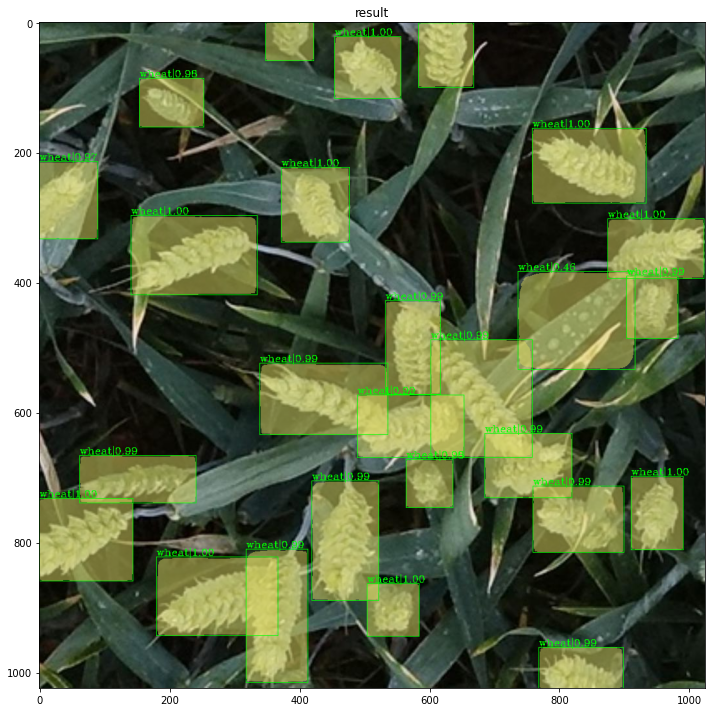

cb256df87.jpg


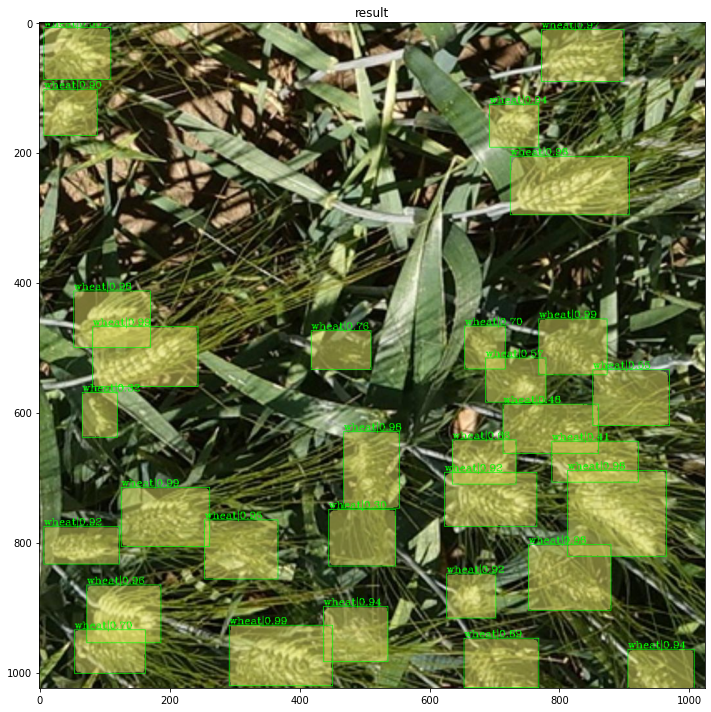

41457a646.jpg


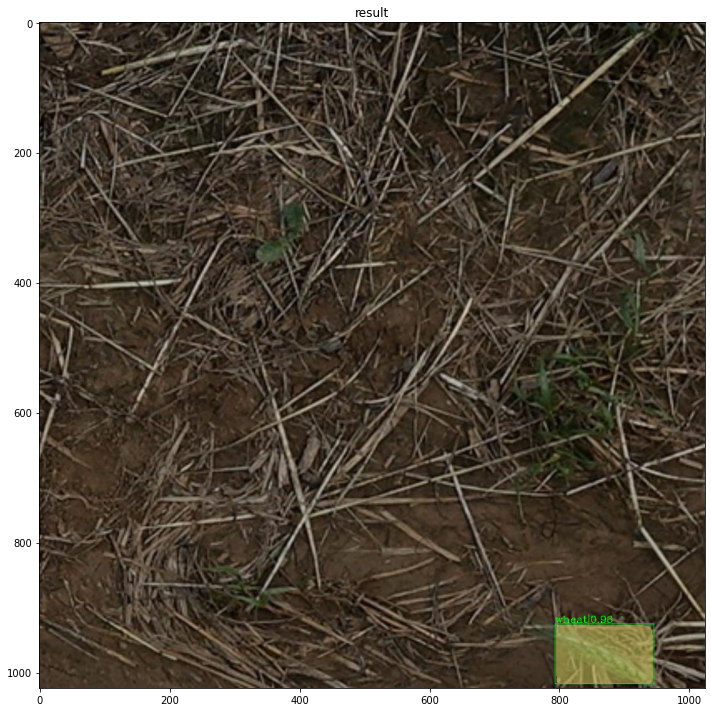

673b64e17.jpg


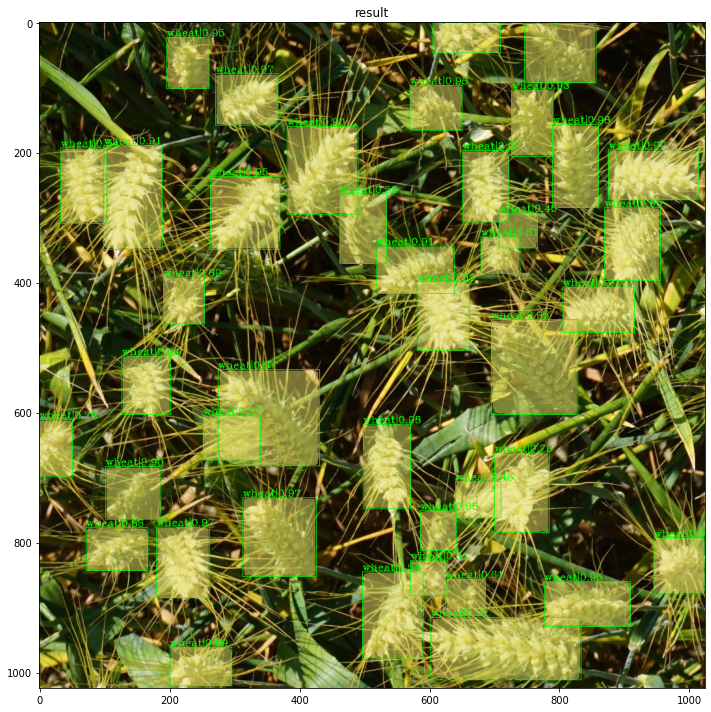

aec95891a.jpg


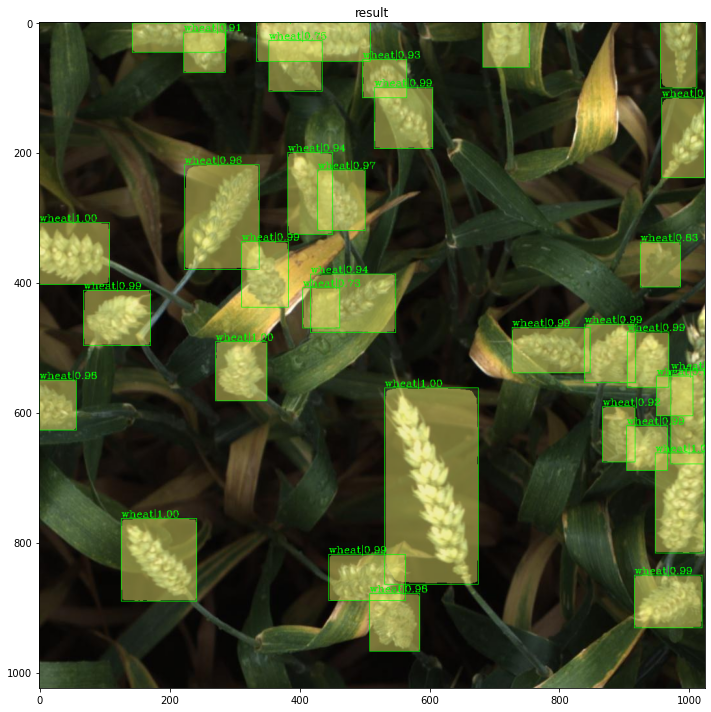

In [ ]:
import random
model.cfg=cfg
folder=data_root+r"val2017/"
for img_file in random.sample(os.listdir(folder), 5):
  img=mmcv.imread(folder+img_file)
  outputs=inference_detector(model, img)
  print(img_file)
  show_result_pyplot(model, img, outputs)

In [ ]:
!wget -c http://download.openmmlab.com/mmdetection/v2.0/resnest/cascade_mask_rcnn_s50_fpn_syncbn-backbone%2Bhead_mstrain_1x_coco/cascade_mask_rcnn_s50_fpn_syncbn-backbone%2Bhead_mstrain_1x_coco_20201122_104428-99eca4c7.pth \
      -P checkpoints
!ls checkpoints

--2021-01-09 10:48:36--  http://download.openmmlab.com/mmdetection/v2.0/resnest/cascade_mask_rcnn_s50_fpn_syncbn-backbone%2Bhead_mstrain_1x_coco/cascade_mask_rcnn_s50_fpn_syncbn-backbone%2Bhead_mstrain_1x_coco_20201122_104428-99eca4c7.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.35
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.35|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 333190287 (318M) [application/octet-stream]
Saving to: ‘checkpoints/cascade_mask_rcnn_s50_fpn_syncbn-backbone+head_mstrain_1x_coco_20201122_104428-99eca4c7.pth’

cascade_mask_rcnn_s 100%[===================>] 317.75M  8.33MB/s    in 39s     

2021-01-09 10:49:16 (8.19 MB/s) - ‘checkpoints/cascade_mask_rcnn_s50_fpn_syncbn-backbone+head_mstrain_1x_coco_20201122_104428-99eca4c7.pth’ saved [333190287/333190287]

cascade_mask_rcnn_r50_fpn_1x_coco_20200203-9d4dcb24.pth
cascade_mask_rcnn_s50_fpn_syncbn-backbone+head_mstrain_1x_coco_20201122

In [6]:
import mmcv
from mmcv import Config
from mmdet.apis import set_random_seed
cfg=Config.fromfile(r"configs/htc/htc_without_semantic_r50_fpn_1x_coco.py")
for i in range(len(cfg.model.roi_head.bbox_head)):
  cfg.model.roi_head.bbox_head[i].num_classes=1
  cfg.model.roi_head.mask_head[i].num_classes=1
#cfg.load_from=r"checkpoints/htc_r50_fpn_1x_coco_20200317-7332cf16.pth"

data_root=r"/content/drive/MyDrive/wheat-coco/archive/coco/"
cfg.data.train.data_root=data_root
cfg.data.train.classes=('wheat',)
cfg.data.train.ann_file=data_root + r"annotations/instances_train2017.json"
cfg.data.train.img_prefix=data_root + r"train2017/"

cfg.data.val.data_root=data_root
cfg.data.val.classes=('wheat',)
cfg.data.val.ann_file=data_root + r"annotations/instances_val2017.json"
cfg.data.val.img_prefix=data_root + r"val2017/"

cfg.data.test.data_root=data_root
cfg.data.test.classes=('wheat',)
cfg.data.test.ann_file=data_root + r"annotations/instances_val2017.json"
cfg.data.test.img_prefix=data_root + r"val2017/"

cfg.work_dir=r"/content/drive/MyDrive/wheat-coco/htc_s50_work_dir"
cfg.optimizer.lr = 0.02/8                                # Since we are using a single GPU only.
cfg.lr_config.warmup = None
cfg.log_config.interval = 5
cfg.total_epochs = 12
cfg.evaluation.interval = 5
cfg.checkpoint_config.interval = 5
cfg.seed = 0
cfg.gpu_ids = range(1)

set_random_seed(0, deterministic=False)
norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.pretrained='open-mmlab://resnest50'
#cfg.model.pretrained=r"checkpoints/cascade_mask_rcnn_s50_fpn_syncbn-backbone+head_mstrain_1x_coco_20201122_104428-99eca4c7.pth"
cfg.model.pretrained=None
cfg.model.backbone=dict(
        type='ResNeSt',
        stem_channels=64,
        depth=50,
        radix=2,
        reduction_factor=4,
        avg_down_stride=True,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=0,
        norm_cfg=norm_cfg,
        norm_eval=False,
        style='pytorch')
#cfg.load_from=r"checkpoints/cascade_mask_rcnn_s50_fpn_syncbn-backbone+head_mstrain_1x_coco_20201122_104428-99eca4c7.pth"
cfg.total_epochs=15


In [8]:
import os
import os.path as osp
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import inference_detector, init_detector, show_result_pyplot, train_detector
datasets=[build_dataset(cfg.data.train)]
model=build_detector(cfg.model, train_cfg=cfg.train_cfg, test_cfg=cfg.test_cfg)
model.CLASSES=datasets[0].CLASSES
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=2.23s)
creating index...
index created!
loading annotations into memory...


2021-01-10 09:42:09,104 - mmdet - INFO - Start running, host: root@02b7befb962e, work_dir: /content/drive/MyDrive/wheat-coco/htc_s50_work_dir
2021-01-10 09:42:09,105 - mmdet - INFO - workflow: [('train', 1)], max: 15 epochs


Done (t=0.37s)
creating index...
index created!


2021-01-10 09:42:36,875 - mmdet - INFO - Epoch [1][5/479]	lr: 2.500e-03, eta: 11:04:23, time: 5.552, data_time: 4.339, memory: 6000, loss_rpn_cls: 0.6895, loss_rpn_bbox: 0.2011, s0.loss_cls: 0.5237, s0.acc: 78.4375, s0.loss_bbox: 0.2791, s0.loss_mask: 3.2698, s1.loss_cls: 0.3060, s1.acc: 72.7344, s1.loss_bbox: 0.0772, s1.loss_mask: 2.5597, s2.loss_cls: 0.1298, s2.acc: 77.2461, s2.loss_bbox: 0.0112, s2.loss_mask: 1.9538, loss: 10.0008
2021-01-10 09:42:43,877 - mmdet - INFO - Epoch [1][10/479]	lr: 2.500e-03, eta: 6:55:36, time: 1.399, data_time: 0.249, memory: 6008, loss_rpn_cls: 0.6497, loss_rpn_bbox: 0.1580, s0.loss_cls: 0.7435, s0.acc: 75.3320, s0.loss_bbox: 0.3621, s0.loss_mask: 3.5897, s1.loss_cls: 0.2085, s1.acc: 86.8945, s1.loss_bbox: 0.1094, s1.loss_mask: 0.7024, s2.loss_cls: 0.1000, s2.acc: 90.0000, s2.loss_bbox: 0.0229, s2.loss_mask: 0.9851, loss: 7.6313
2021-01-10 09:42:50,158 - mmdet - INFO - Epoch [1][15/479]	lr: 2.500e-03, eta: 5:26:56, time: 1.257, data_time: 0.118, memory

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 338/338, 1.4 task/s, elapsed: 243s, ETA:     0s

2021-01-10 10:55:27,128 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.11s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=34.22s).
Accumulating evaluation results...


2021-01-10 10:56:02,173 - mmdet - INFO - Evaluating segm...


DONE (t=0.70s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.291
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.678
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.196
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.027
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.282
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.339
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.389
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.389
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.389
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.034
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.372
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.465
Loading and preparing resul

2021-01-10 10:56:38,275 - mmdet - INFO - Epoch(val) [5][479]	bbox_mAP: 0.2910, bbox_mAP_50: 0.6780, bbox_mAP_75: 0.1960, bbox_mAP_s: 0.0270, bbox_mAP_m: 0.2820, bbox_mAP_l: 0.3390, bbox_mAP_copypaste: 0.291 0.678 0.196 0.027 0.282 0.339, segm_mAP: 0.2960, segm_mAP_50: 0.6820, segm_mAP_75: 0.2020, segm_mAP_s: 0.0300, segm_mAP_m: 0.2890, segm_mAP_l: 0.3350, segm_mAP_copypaste: 0.296 0.682 0.202 0.030 0.289 0.335


DONE (t=0.72s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.296
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.682
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.202
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.030
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.289
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.335
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.393
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.393
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.393
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.037
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.379
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.458


2021-01-10 10:56:50,871 - mmdet - INFO - Epoch [6][5/479]	lr: 2.500e-03, eta: 2:17:07, time: 2.515, data_time: 0.734, memory: 6692, loss_rpn_cls: 0.1352, loss_rpn_bbox: 0.1069, s0.loss_cls: 0.3375, s0.acc: 84.7070, s0.loss_bbox: 0.3096, s0.loss_mask: 0.3364, s1.loss_cls: 0.1641, s1.acc: 85.3419, s1.loss_bbox: 0.2977, s1.loss_mask: 0.1372, s2.loss_cls: 0.0850, s2.acc: 84.7063, s2.loss_bbox: 0.1335, s2.loss_mask: 0.0514, loss: 2.0944
2021-01-10 10:56:59,950 - mmdet - INFO - Epoch [6][10/479]	lr: 2.500e-03, eta: 2:16:59, time: 1.816, data_time: 0.156, memory: 6692, loss_rpn_cls: 0.1396, loss_rpn_bbox: 0.1027, s0.loss_cls: 0.3499, s0.acc: 83.1836, s0.loss_bbox: 0.3218, s0.loss_mask: 0.2955, s1.loss_cls: 0.1760, s1.acc: 83.3557, s1.loss_bbox: 0.3146, s1.loss_mask: 0.1228, s2.loss_cls: 0.0902, s2.acc: 83.5517, s2.loss_bbox: 0.1387, s2.loss_mask: 0.0443, loss: 2.0961
2021-01-10 10:57:09,177 - mmdet - INFO - Epoch [6][15/479]	lr: 2.500e-03, eta: 2:16:52, time: 1.845, data_time: 0.141, memory: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 338/338, 1.5 task/s, elapsed: 220s, ETA:     0s

2021-01-10 12:11:55,907 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.37s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=36.49s).
Accumulating evaluation results...


2021-01-10 12:12:33,552 - mmdet - INFO - Evaluating segm...


DONE (t=0.76s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.339
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.734
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.263
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.033
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.326
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.399
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.424
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.424
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.424
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.045
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.408
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.499
Loading and preparing resul

2021-01-10 12:13:12,468 - mmdet - INFO - Epoch(val) [10][479]	bbox_mAP: 0.3390, bbox_mAP_50: 0.7340, bbox_mAP_75: 0.2630, bbox_mAP_s: 0.0330, bbox_mAP_m: 0.3260, bbox_mAP_l: 0.3990, bbox_mAP_copypaste: 0.339 0.734 0.263 0.033 0.326 0.399, segm_mAP: 0.3410, segm_mAP_50: 0.7350, segm_mAP_75: 0.2650, segm_mAP_s: 0.0360, segm_mAP_m: 0.3310, segm_mAP_l: 0.3910, segm_mAP_copypaste: 0.341 0.735 0.265 0.036 0.331 0.391


DONE (t=0.77s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.341
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.735
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.265
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.036
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.331
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.391
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.425
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.425
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.425
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.048
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.413
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.488


2021-01-10 12:13:25,021 - mmdet - INFO - Epoch [11][5/479]	lr: 2.500e-04, eta: 1:09:39, time: 2.506, data_time: 0.850, memory: 6692, loss_rpn_cls: 0.1409, loss_rpn_bbox: 0.0905, s0.loss_cls: 0.3082, s0.acc: 86.4648, s0.loss_bbox: 0.2771, s0.loss_mask: 0.3043, s1.loss_cls: 0.1618, s1.acc: 85.7568, s1.loss_bbox: 0.2722, s1.loss_mask: 0.1235, s2.loss_cls: 0.0828, s2.acc: 85.3833, s2.loss_bbox: 0.1179, s2.loss_mask: 0.0436, loss: 1.9230
2021-01-10 12:13:34,202 - mmdet - INFO - Epoch [11][10/479]	lr: 2.500e-04, eta: 1:09:31, time: 1.836, data_time: 0.134, memory: 6692, loss_rpn_cls: 0.1467, loss_rpn_bbox: 0.0906, s0.loss_cls: 0.3067, s0.acc: 86.4453, s0.loss_bbox: 0.2734, s0.loss_mask: 0.3039, s1.loss_cls: 0.1582, s1.acc: 85.8060, s1.loss_bbox: 0.2782, s1.loss_mask: 0.1231, s2.loss_cls: 0.0839, s2.acc: 84.9320, s2.loss_bbox: 0.1301, s2.loss_mask: 0.0469, loss: 1.9417
2021-01-10 12:13:44,074 - mmdet - INFO - Epoch [11][15/479]	lr: 2.500e-04, eta: 1:09:23, time: 1.975, data_time: 0.170, memor

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 338/338, 1.4 task/s, elapsed: 245s, ETA:     0s

2021-01-10 13:29:45,087 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.37s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=35.30s).
Accumulating evaluation results...


2021-01-10 13:30:21,543 - mmdet - INFO - Evaluating segm...


DONE (t=0.76s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.343
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.736
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.269
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.032
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.332
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.398
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.427
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.427
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.427
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.046
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.413
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.495
Loading and preparing resul

2021-01-10 13:30:58,934 - mmdet - INFO - Epoch(val) [15][479]	bbox_mAP: 0.3430, bbox_mAP_50: 0.7360, bbox_mAP_75: 0.2690, bbox_mAP_s: 0.0320, bbox_mAP_m: 0.3320, bbox_mAP_l: 0.3980, bbox_mAP_copypaste: 0.343 0.736 0.269 0.032 0.332 0.398, segm_mAP: 0.3430, segm_mAP_50: 0.7380, segm_mAP_75: 0.2680, segm_mAP_s: 0.0340, segm_mAP_m: 0.3340, segm_mAP_l: 0.3880, segm_mAP_copypaste: 0.343 0.738 0.268 0.034 0.334 0.388


DONE (t=0.74s).
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.343
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.738
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.268
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.034
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.334
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.388
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.427
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.427
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.427
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.049
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.417
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.483


5e7aab7a2.jpg


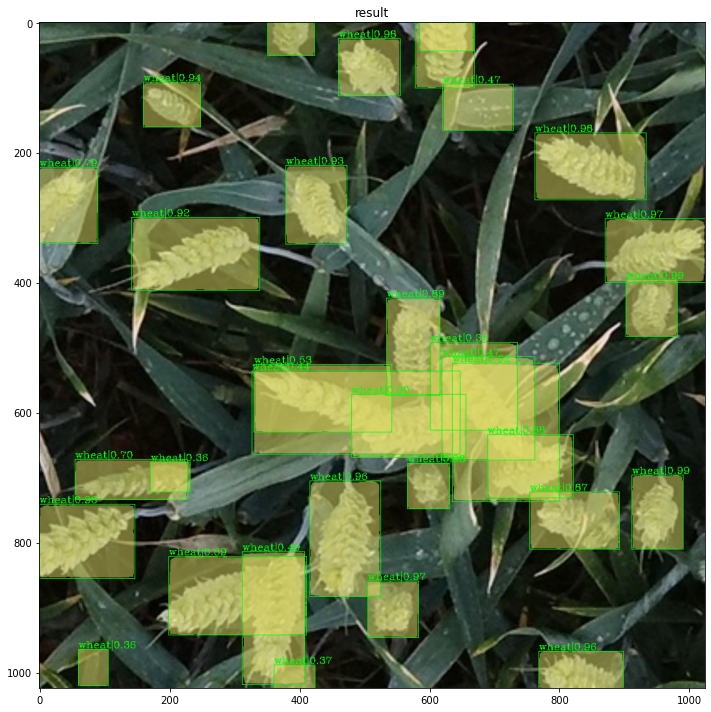

cb256df87.jpg


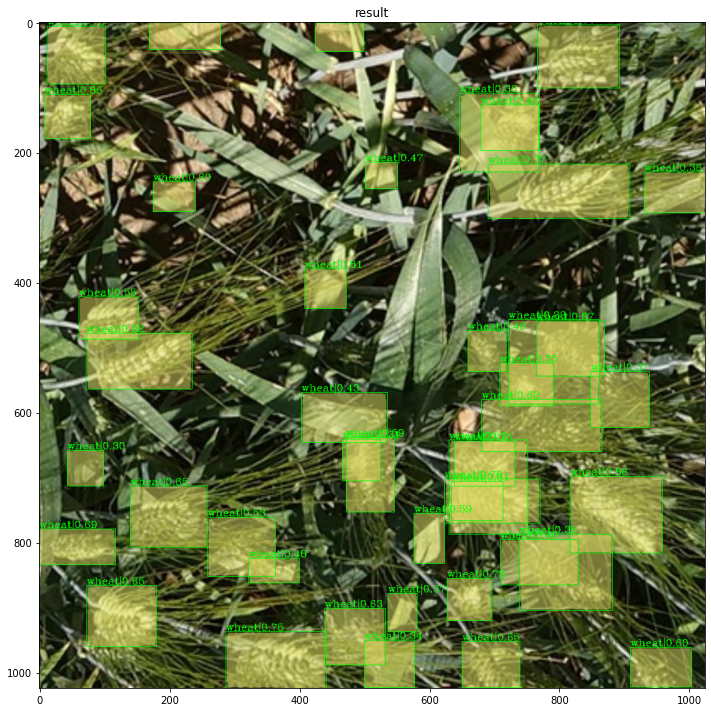

41457a646.jpg


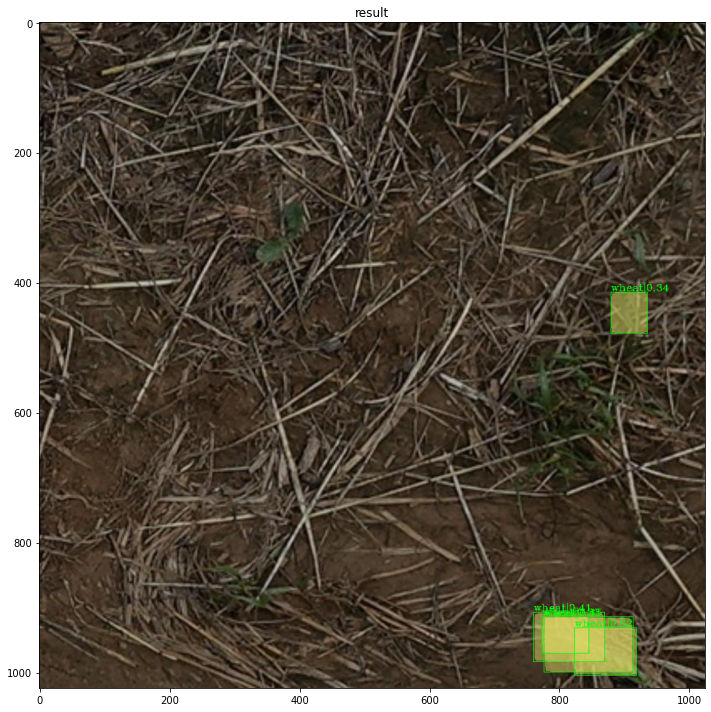

673b64e17.jpg


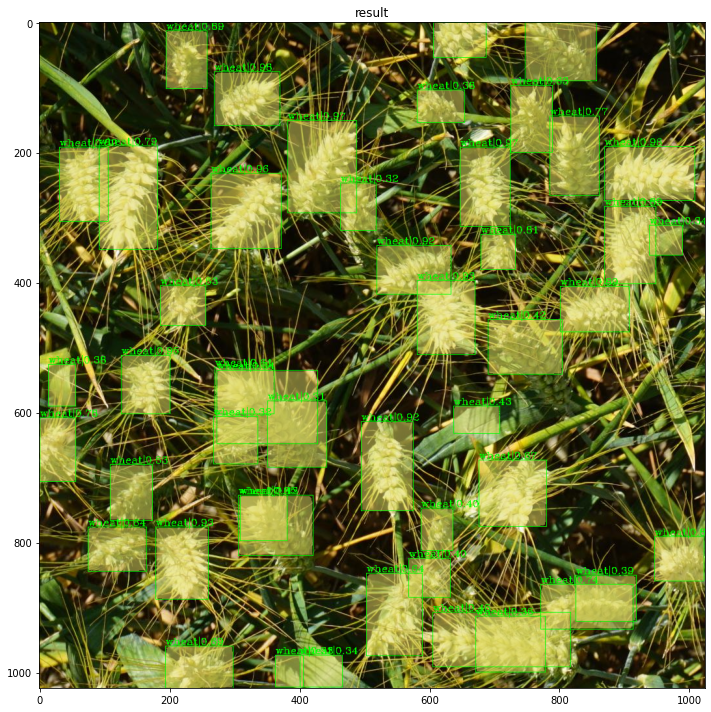

aec95891a.jpg


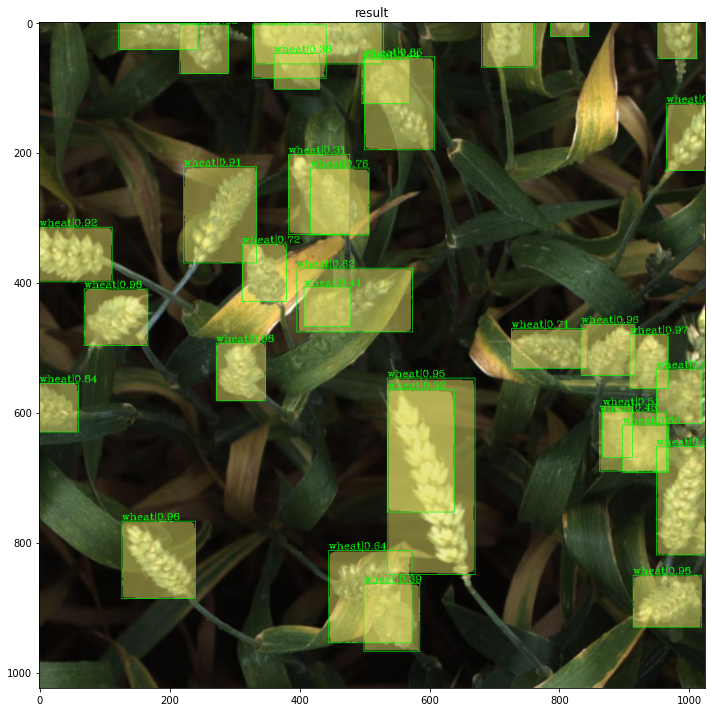

In [12]:
import random
folder=data_root+r"val2017/"
model.cfg=cfg
for img_file in random.sample(os.listdir(folder), 5):
  img=mmcv.imread(folder+img_file)
  outputs=inference_detector(model, img)
  print(img_file)
  show_result_pyplot(model, img, outputs)